In [1]:
 # import files
from google.colab import drive
drive.mount('/content/drive', force_remount=True)

Mounted at /content/drive


In [2]:
cd "/content/drive/My Drive/CSE599iGM/Project"

/content/drive/My Drive/CSE599iGM/Project


In [3]:
import matplotlib.pyplot as plt
import torch
from torchvision import datasets, transforms
import torchvision
import helper
import sys,os,signal
from time import time
import numpy as np
from torch import Tensor
from IPython import display
import matplotlib
import radarplot
import pandas
import re
from skimage import io

In [4]:
# make data lookup table
stats = pandas.read_csv("/content/drive/My Drive/CSE599iGM/Project/SGZ/sango.csv")
stats=stats.dropna()   # remove characters without stats
stats["Sex"]=(stats["Sex"]=="男")*1.0  # 1=male, 0=female. convert to double
imgnamelist=os.listdir("/content/drive/My Drive/CSE599iGM/Project/SGZ/images")
imgstat = {}
for imgname in imgnamelist:
  personname=imgname[:re.search(u'[^\u4E00-\u9FA5]',imgname).start()] # catch until last consecutive chinese char
  if personname in stats["Name"].values:
    imgstat[imgname]=personname  # path as key because some characters have multiple pictures
imgstat=pandas.DataFrame(list(imgstat.items()), columns=["imgpath","personname"]) # build address book
imgstat=pandas.merge(imgstat,stats,how="inner",left_on="personname",right_on="Name") # only keep matched names

In [5]:
# make dataloader
from torch.utils.data import Dataset, DataLoader
class SGZ(Dataset):
    def __init__(self, df):
        self.df = df
        self.transform = transforms.Compose([transforms.ToTensor(),
                                transforms.Resize(64)])

    def __len__(self):
        return self.df.shape[0]

    def __getitem__(self, index):
        image = self.transform(io.imread(os.path.join("SGZ/images",self.df.imgpath[index])))
        label = self.df[["Sex","LEAD","MAR","INT","POL","CHAR"]].iloc[index].to_numpy()/100
        return image, label

In [6]:
# utility functions
def print_images(x, ax, n=5, d=64, color='black'):
    ax.cla()
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)

    panel = np.zeros([x.shape[1],n*d,n*d])
    for i in range(n):
        for j in range(n):
            panel[:,i*d:(i+1)*d,j*d:(j+1)*d] = x[i*n+j]

    ax.imshow(panel.transpose(1,2,0).squeeze(), cmap=plt.get_cmap('Greys'))
    plt.setp(ax.spines.values(), color=color)
def print_images_stats(images,stats):
  theta = radarplot.radar_factory(5, frame='polygon')
  fig = plt.figure(figsize=(22,10))
  ax1 = plt.subplot2grid((5, 10), (0, 0), colspan=5, rowspan=5)
  print_images(images, ax1,n=5, d=64);
  for i in range(5):
    for j in range(5):
      axnew = plt.subplot2grid((5, 10), (i, j+5),projection="radar")
      n=i*5+j
      stat=stats[n][1:]
      slabel=np.array(["L","M","I","P","C"])
      angles=np.linspace(0, 2*np.pi, len(slabel), endpoint=False)
      # close the plot
      stat=np.concatenate((stat,[stat[0]]))
      angles=np.concatenate((angles,[angles[0]]))
      axnew.plot(angles, stat, 'o-', linewidth=2)
      axnew.fill(angles, stat, alpha=0.25)
      axnew.set_thetagrids(angles * 180/np.pi, slabel)
def print_images_compare_stats(images1,images2,stats):
  theta = radarplot.radar_factory(5, frame='polygon')
  fig = plt.figure(figsize=(32,10))
  ax1 = plt.subplot2grid((5, 15), (0, 0), colspan=5, rowspan=5)
  ax2 = plt.subplot2grid((5, 15), (0, 5), colspan=5, rowspan=5)
  print_images(images1, ax1,n=5, d=64);
  print_images(images2, ax2,n=5, d=64);
  for i in range(5):
    for j in range(5):
      axnew = plt.subplot2grid((5, 15), (i, j+10),projection="radar")
      n=i*5+j
      stat=stats[n][1:]
      slabel=np.array(["L","M","I","P","C"])
      angles=np.linspace(0, 2*np.pi, len(slabel), endpoint=False)
      # close the plot
      stat=np.concatenate((stat,[stat[0]]))
      angles=np.concatenate((angles,[angles[0]]))
      axnew.plot(angles, stat, 'o-', linewidth=2)
      axnew.fill(angles, stat, alpha=0.25)
      axnew.set_thetagrids(angles * 180/np.pi, slabel)

In [7]:
# Define data 
seed_size = 128
batch_size = 25
dataset = SGZ(imgstat)
dataloader = torch.utils.data.DataLoader(dataset, batch_size=batch_size, shuffle=True,drop_last=True)

In [8]:
#@title Model
# Define Model
import torch
import torch.nn.functional as F

class Block(torch.nn.Module):
    def __init__(self, filters):
        super(Block, self).__init__()

        self.block = torch.nn.Sequential(
            torch.nn.Conv3d(filters, filters, 3, padding=1, bias=False),
            torch.nn.BatchNorm3d(filters), torch.nn.ReLU(),
            torch.nn.Conv3d(filters, filters, 3, padding=1, bias=False),
            torch.nn.BatchNorm3d(filters))

    def forward(self, x):
        return F.relu(x + self.block(x))

class DBlock(torch.nn.Module):
    def __init__(self, filters, stride=1):
        super(DBlock, self).__init__()
        self.stride=stride

        # No BatchNorm
        self.block = torch.nn.Sequential(
            torch.nn.Conv3d(filters, filters, 3, padding=1, bias=False), torch.nn.ReLU(),
            torch.nn.Conv3d(filters, filters, 3, padding=1, stride=stride, bias=False))

    def forward(self, x):
        return F.relu(x[:,:,:,::self.stride,::self.stride] + self.block(x))

class Upsample(torch.nn.Module):
    def __init__(self, fin, fout, factor):
        super(Upsample, self).__init__()

        self.block = torch.nn.Sequential(
            torch.nn.Upsample(size=[3, 64, 64], mode='trilinear', align_corners=False),
            torch.nn.Conv3d(fin, fout, 3, padding=1, bias=False),
            torch.nn.BatchNorm3d(fout), torch.nn.ReLU())

    def forward(self, x):
        return self.block(x)
class Generator(torch.nn.Module):
    def __init__(self, seed_size, capacity=128):
        super(Generator, self).__init__()
        self.capacity = capacity

        self.embed = torch.nn.Linear(seed_size, capacity*3*16*16, bias=False)
        self.embedl = torch.nn.Linear(6, capacity*1*16*16, bias=False)

        self.resnet = torch.nn.ModuleList()
        for i in range(9): self.resnet.append(Block(capacity))
        self.resnet.append(Upsample(capacity, capacity, 4))

        self.image = torch.nn.Conv3d(capacity, 1, 3, padding=1, bias=True)
        self.bias = torch.nn.Parameter(torch.Tensor(1,3,64,64))

        for name, parm in self.named_parameters():
            if name.endswith('weight'): torch.nn.init.normal_(parm, 0, .05)
            if name.endswith('bias'): torch.nn.init.constant_(parm, 0.0)

    def forward(self, s,l):
        zx = torch.cat((self.embed(s).view(-1,self.capacity,3,16,16),
                        self.embedl(l).view(-1,self.capacity,1,16,16)),2)
        zx = F.relu(zx)
        for layer in self.resnet: zx = layer(zx)
        return torch.squeeze(torch.sigmoid(self.image(zx) + self.bias[None,:,:,:,:]))
class Discriminator(torch.nn.Module):
    def __init__(self, capacity=128, weight_scale=.01):
        super(Discriminator, self).__init__()
        self.capacity = capacity

        self.embed = torch.nn.Conv3d(1, capacity, 3, padding=1, bias=False)
        self.embedl = torch.nn.Linear(6, capacity*1*64*64, bias=False)

        self.resnet = torch.nn.ModuleList()
        self.resnet.append(DBlock(capacity, stride=4))
        for i in range(3): self.resnet.append(DBlock(capacity))

        self.out = torch.nn.Linear(capacity, 1, bias=True)

        for name, parm in self.named_parameters():
            if name.endswith('weight'): torch.nn.init.normal_(parm, 0, .05)
            if name.endswith('bias'): torch.nn.init.constant_(parm, 0.0)

    def forward(self, x,l):
        zx = torch.cat((self.embed(x[:,None,:,:,:]),
                        self.embedl(l).view(-1,128,1,64,64)),2)
        zx = F.relu(zx)
        for layer in self.resnet: zx = layer(zx)
        return self.out(zx.sum(dim=(2,3,4)))
def gradient_penalty(f, real_data, fake_data,l):
    alpha = torch.rand(real_data.shape[0], 1, 1, 1)
    alpha = alpha.expand(real_data.size()).cuda()

    interpolates = (alpha * real_data + ((1 - alpha) * fake_data)).detach()
    interpolates.requires_grad = True

    disc_interpolates = f(interpolates,l)

    gradients = torch.autograd.grad(outputs=disc_interpolates, inputs=interpolates,
                                    grad_outputs=torch.ones(disc_interpolates.size()).cuda(),
                                    create_graph=True, retain_graph=True, only_inputs=True)[0]

    return ((gradients.reshape(real_data.shape[0],-1).norm(2, dim=1) - 1) ** 2).mean()

In [9]:
g = Generator(seed_size)
f = Discriminator()
g.load_state_dict(torch.load("/content/drive/My Drive/CSE599iGM/Project/gpicklewcganFINAL",map_location=torch.device('cpu')))
g.eval()
f.load_state_dict(torch.load("/content/drive/My Drive/CSE599iGM/Project/fpicklewcganFINAL",map_location=torch.device('cpu')))
f.eval();

# Demo


In [10]:
pwd

'/content/drive/My Drive/CSE599iGM/Project'

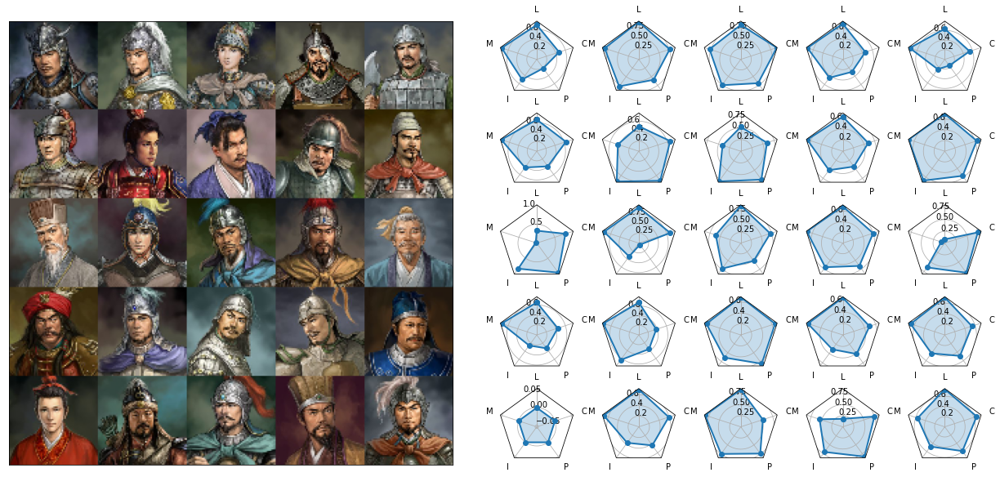

In [11]:
# true samples
sample_true,label = next(iter(dataloader))
print_images_stats(sample_true,label)

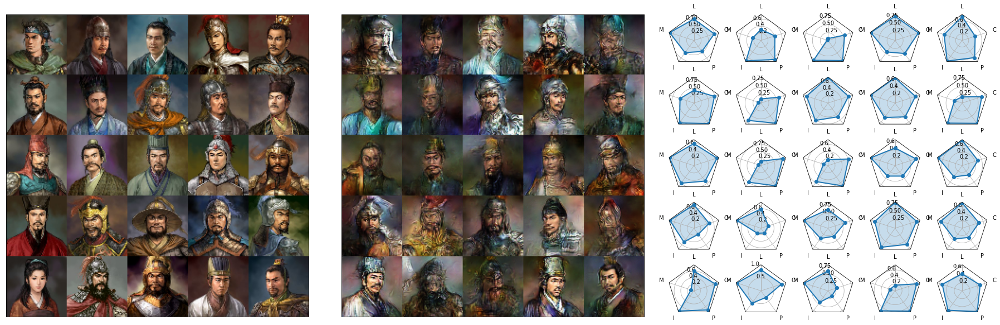

In [12]:
# profile
sample_true, label = next(iter(dataloader))
sample_fake = g(torch.randn(batch_size, seed_size),label.float()).detach()
print_images_compare_stats(sample_true,sample_fake,label)

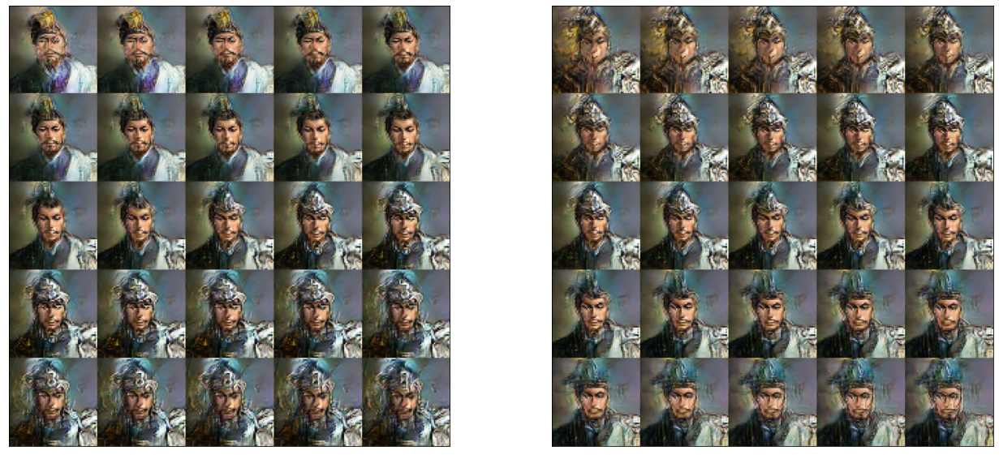

In [69]:
# Mar+Int
basestat=0.5
fixed_noise= torch.randn(1, seed_size)
mar_slide = torch.tensor(np.transpose(np.vstack([[0.01]*25,np.linspace(0,1,num=25),np.linspace(0,1,num=25),[basestat]*25,[basestat]*25,[basestat]*25])))
int_slide = torch.tensor(np.transpose(np.vstack([[0.01]*25,[basestat]*25,[basestat]*25,np.linspace(0,1,num=25),np.linspace(0,1,num=25),[basestat]*25])))
sample_fake_mar = g(torch.cat(25*[fixed_noise]),mar_slide.float()).detach()
sample_fake_int = g(torch.cat(25*[fixed_noise]),int_slide.float()).detach()
fig,ax=plt.subplots(1,2,figsize=(22,10))
print_images(sample_fake_mar,ax[0])
print_images(sample_fake_int,ax[1])

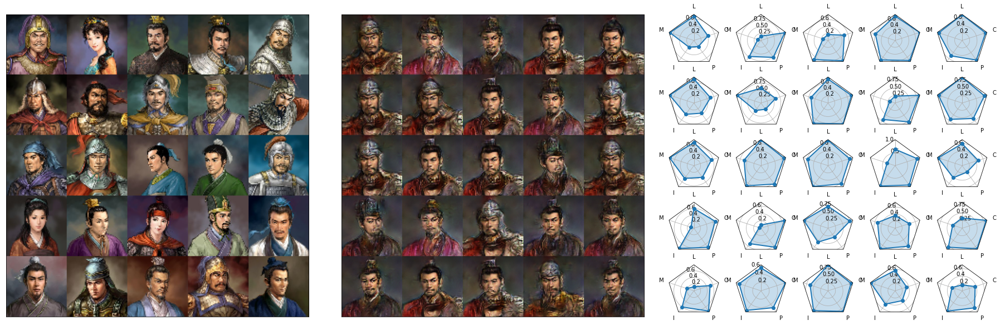

In [14]:
# profile
sample_true, label = next(iter(dataloader))
fixed_noise= torch.cat(batch_size*[torch.randn(1, seed_size)])
sample_fake = g(fixed_noise,label.float()).detach()
print_images_compare_stats(sample_true,sample_fake,label)

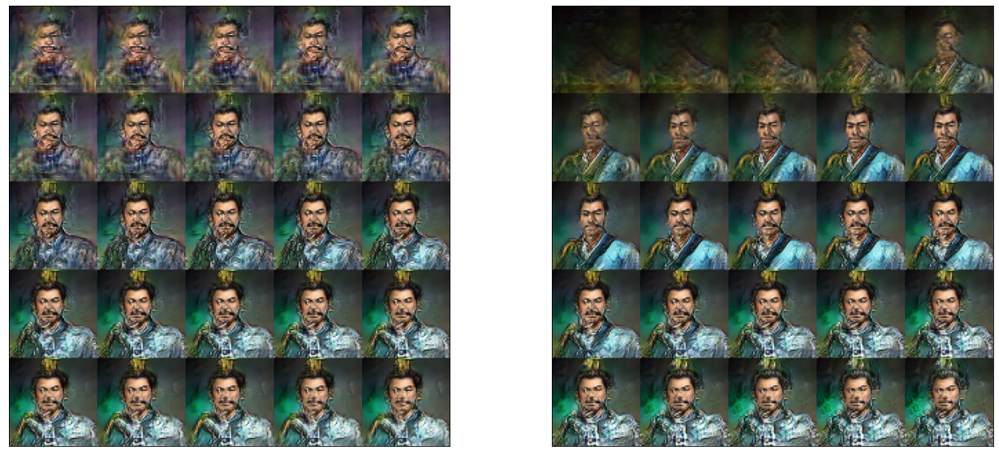

In [15]:
# Char+All
basestat=0.7
fixed_noise= torch.randn(1, seed_size)
char_slide = torch.tensor(np.transpose(np.vstack([[0.01]*25,[basestat]*25,[basestat]*25,[basestat]*25,[basestat]*25,np.linspace(0,1,num=25)])))
all_slide = torch.tensor(np.transpose(np.vstack([[0.01]*25,np.linspace(0,1,num=25),np.linspace(0,1,num=25),np.linspace(0,1,num=25),np.linspace(0,1,num=25),np.linspace(0,1,num=25)])))
sample_fake_char = g(torch.cat(25*[fixed_noise]),char_slide.float()).detach()
sample_fake_all = g(torch.cat(25*[fixed_noise]),all_slide.float()).detach()
fig,ax=plt.subplots(1,2,figsize=(22,10))
print_images(sample_fake_char,ax[0])
print_images(sample_fake_all,ax[1])

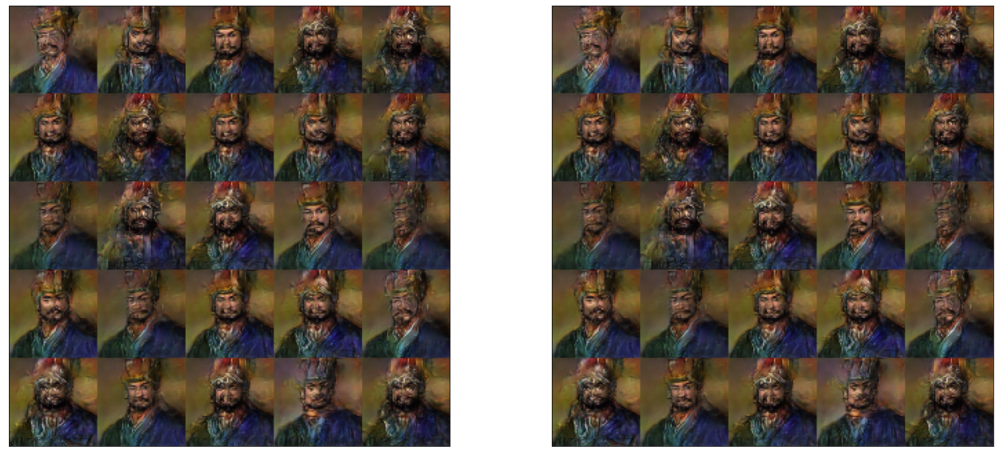

In [16]:
# sex
sample_true, label = next(iter(dataloader))
fixed_noise= torch.cat(batch_size*[torch.randn(1, seed_size)])
label[:,0]=0.01
sample_fake_man = g(fixed_noise,label.float()).detach()
label[:,0]=0.00
sample_fake_woman = g(fixed_noise,label.float()).detach()
fig,ax=plt.subplots(1,2,figsize=(22,10))
print_images(sample_fake_man,ax[0])
print_images(sample_fake_woman,ax[1])

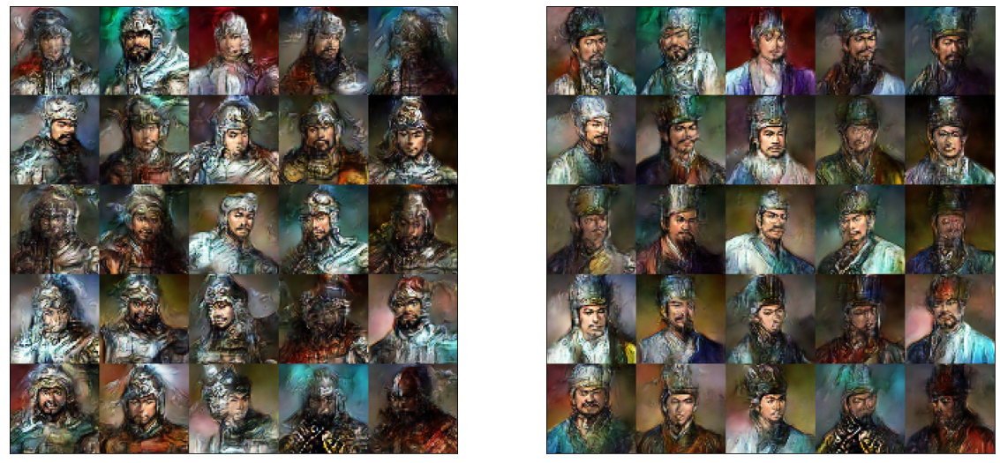

In [17]:
# guanyu vs zhugeliang
basestat=0.5
fig, ax = plt.subplots(1,2,figsize=(20,10))
fixed_noise= torch.randn(25, seed_size)
guanyu = torch.transpose(torch.tensor(np.repeat([1,95,97,75,62,93],25)*0.01).view(-1,25),0,1).float()
sample_fake1 = g(fixed_noise,guanyu).detach().cpu()
zhuge = torch.transpose(torch.tensor(np.repeat([1,92,38,100,95,92],25)*0.01).view(-1,25),0,1).float()
sample_fake2 = g(fixed_noise,zhuge).detach().cpu()
print_images(sample_fake1, ax[0],n=5, d=64);
print_images(sample_fake2, ax[1],n=5, d=64);

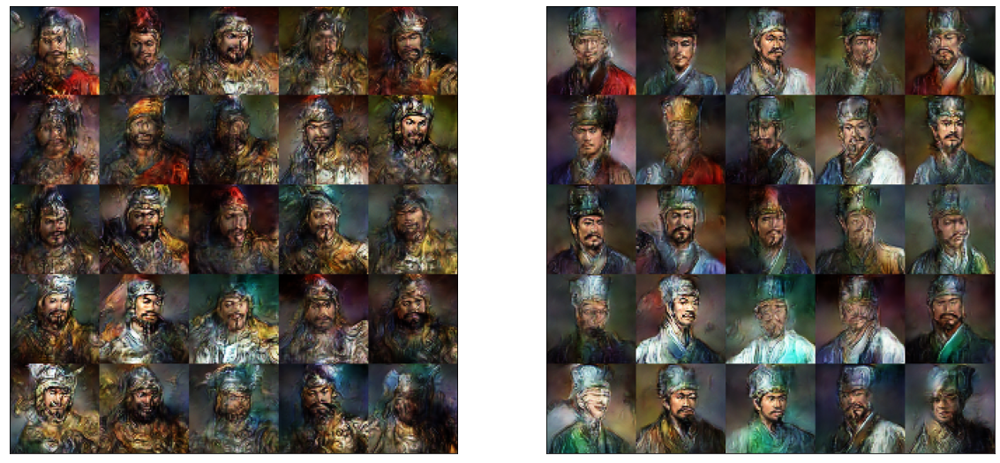

In [58]:
# lvbu vs guojia
basestat=0.5
fig, ax = plt.subplots(1,2,figsize=(20,10))
fixed_noise= torch.randn(25, seed_size)
lvbu = torch.tensor(np.asarray([imgstat.loc[imgstat["personname"].isin(
    ["吕布"])].iloc[0].values[3:10]*0.01]*25).astype(float)).float()
sample_fake1 = g(fixed_noise,lvbu).detach().cpu()
guojia = torch.tensor(np.asarray([imgstat.loc[imgstat["personname"].isin(
    ["郭嘉"])].iloc[0].values[3:10]*0.01]*25).astype(float)).float()
sample_fake2 = g(fixed_noise,guojia).detach().cpu()
print_images(sample_fake1, ax[0],n=5, d=64);
print_images(sample_fake2, ax[1],n=5, d=64);

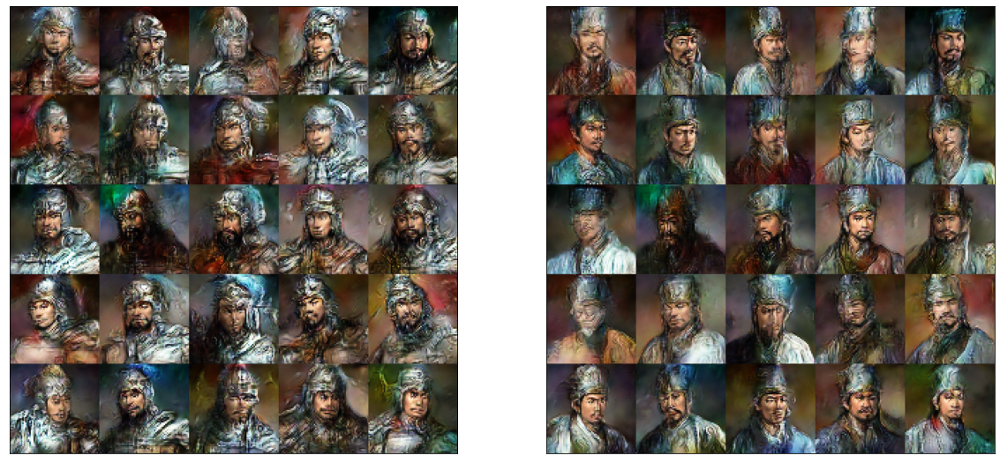

In [57]:
# liubei vs caocao
basestat=0.5
fig, ax = plt.subplots(1,2,figsize=(20,10))
fixed_noise= torch.randn(25, seed_size)
left = torch.tensor(np.asarray([imgstat.loc[imgstat["personname"].isin(
    ["关羽"])].iloc[0].values[3:10]*0.01]*25).astype(float)).float()
sample_fake1 = g(fixed_noise,left).detach().cpu()
right = torch.tensor(np.asarray([imgstat.loc[imgstat["personname"].isin(
    ["诸葛亮"])].iloc[0].values[3:10]*0.01]*25).astype(float)).float()
sample_fake2 = g(fixed_noise,right).detach().cpu()
print_images(sample_fake1, ax[0],n=5, d=64);
print_images(sample_fake2, ax[1],n=5, d=64);

In [19]:
from prettytable import PrettyTable

def count_parameters(model):
    table = PrettyTable(["Modules", "Parameters"])
    total_params = 0
    for name, parameter in model.named_parameters():
        if not parameter.requires_grad: continue
        param = parameter.numel()
        table.add_row([name, param])
        total_params+=param
    print(table)
    print(f"Total Trainable Params: {total_params}")
    return total_params

In [20]:
count_parameters(f)

+-------------------------+------------+
|         Modules         | Parameters |
+-------------------------+------------+
|       embed.weight      |    3456    |
|      embedl.weight      |  3145728   |
| resnet.0.block.0.weight |   442368   |
| resnet.0.block.2.weight |   442368   |
| resnet.1.block.0.weight |   442368   |
| resnet.1.block.2.weight |   442368   |
| resnet.2.block.0.weight |   442368   |
| resnet.2.block.2.weight |   442368   |
| resnet.3.block.0.weight |   442368   |
| resnet.3.block.2.weight |   442368   |
|        out.weight       |    128     |
|         out.bias        |     1      |
+-------------------------+------------+
Total Trainable Params: 6688257


6688257

In [61]:
imgstat.loc[imgstat["personname"].isin(
    ["诸葛亮"])].iloc[0].values[3:10]

array([1.0, 92.0, 38.0, 100.0, 95.0, 92.0], dtype=object)

tensor([[0.0100, 0.7500, 0.7300, 0.7400, 0.7800, 0.9900],
        [0.0100, 0.7500, 0.7300, 0.7400, 0.7800, 0.9900],
        [0.0100, 0.7500, 0.7300, 0.7400, 0.7800, 0.9900],
        [0.0100, 0.7500, 0.7300, 0.7400, 0.7800, 0.9900],
        [0.0100, 0.7500, 0.7300, 0.7400, 0.7800, 0.9900],
        [0.0100, 0.7500, 0.7300, 0.7400, 0.7800, 0.9900],
        [0.0100, 0.7500, 0.7300, 0.7400, 0.7800, 0.9900],
        [0.0100, 0.7500, 0.7300, 0.7400, 0.7800, 0.9900],
        [0.0100, 0.7500, 0.7300, 0.7400, 0.7800, 0.9900],
        [0.0100, 0.7500, 0.7300, 0.7400, 0.7800, 0.9900],
        [0.0100, 0.7500, 0.7300, 0.7400, 0.7800, 0.9900],
        [0.0100, 0.7500, 0.7300, 0.7400, 0.7800, 0.9900],
        [0.0100, 0.7500, 0.7300, 0.7400, 0.7800, 0.9900],
        [0.0100, 0.7500, 0.7300, 0.7400, 0.7800, 0.9900],
        [0.0100, 0.7500, 0.7300, 0.7400, 0.7800, 0.9900],
        [0.0100, 0.7500, 0.7300, 0.7400, 0.7800, 0.9900],
        [0.0100, 0.7500, 0.7300, 0.7400, 0.7800, 0.9900],
        [0.010